# Visualize model outputs

This script loads in either val or test data and creates predictions using the trained model of choice. 
These predictions are plotted and evaluated using MSE and R2_score metrics. 

In [1]:
from dataset_class import BasicDataset
import argparse
import yaml
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
config = '../configs/base.yaml'
predictions_dir = 'predictions'

print(f'Using config "{config}"')
cfg = yaml.safe_load(open(config, 'r'))
input_basemap = cfg["input_basemap"]
input_target = cfg["input_target"]
output_target = cfg["output_target"]

# the predictions of interest
predictions_dir = os.path.join(cfg['data_root'], predictions_dir)

Using config "../configs/base.yaml"


In [ ]:
#get most recent split with info about the landcover
splits_loc = cfg['splits_loc']

split_files = [file for file in os.listdir(self.splits_loc) if file.endswith(".csv")] # list all the different splits
recent_split = sorted(split_files, key=lambda fn:os.path.getctime(os.path.join(self.splits_loc, fn)))[-1] # get most recent split
split_file = pd.read_csv(os.path.join(self.splits_loc, recent_split))


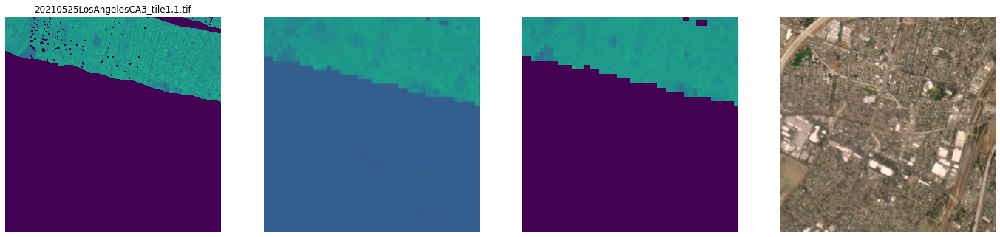

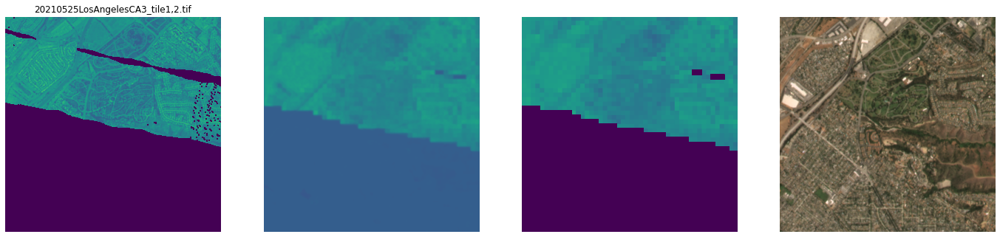

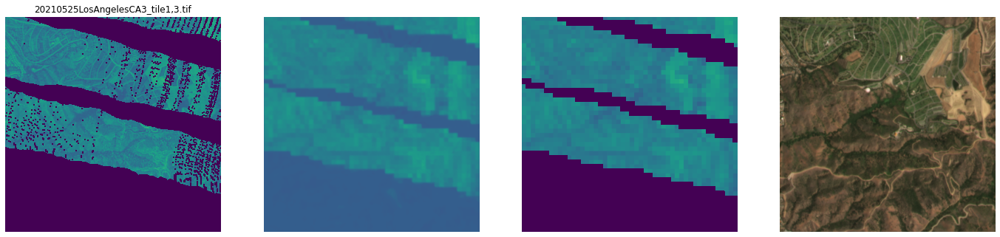

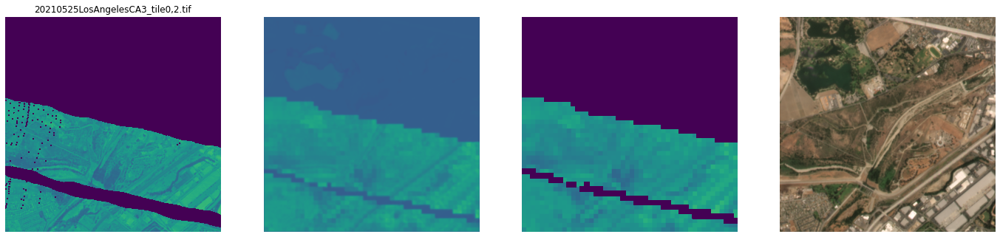

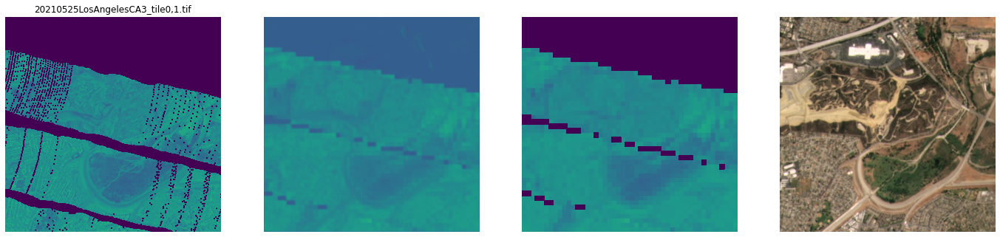

...

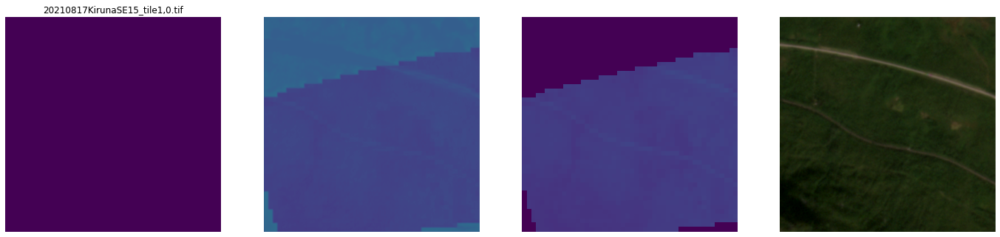

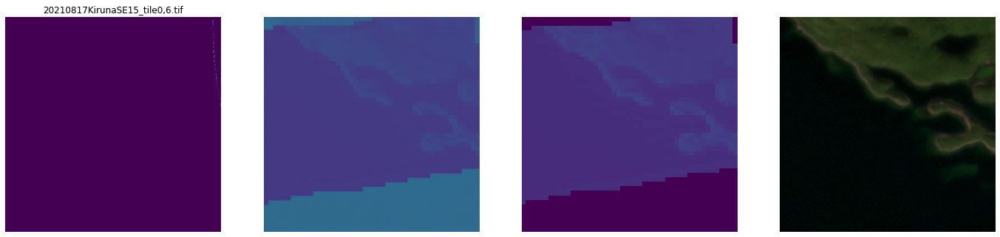

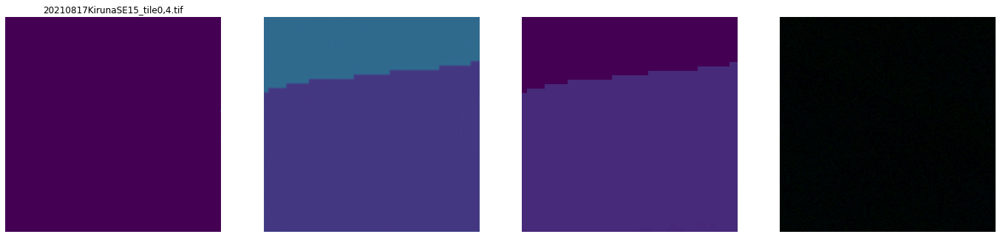

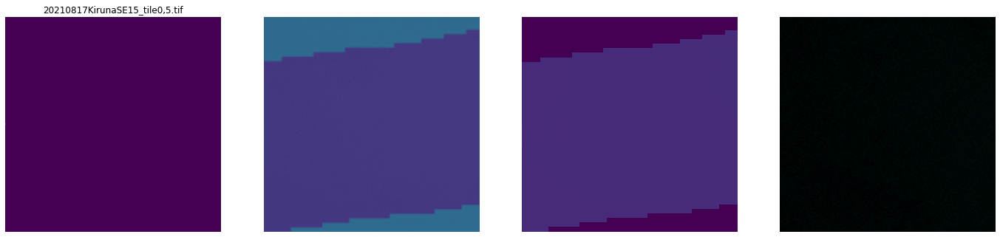

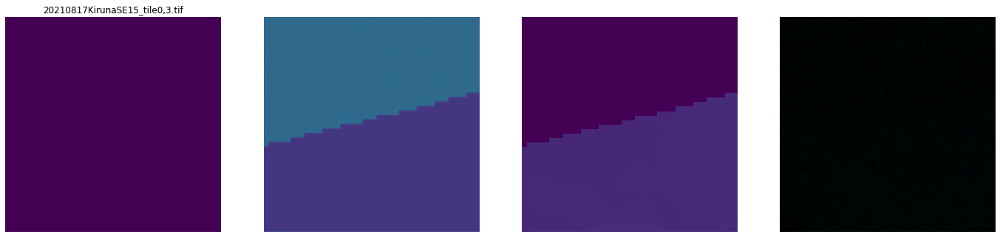

In [5]:
for image in os.listdir(predictions_dir):
    # get the landcover
    landcover = split_file[split_file['tiles'] == image]["Main Cover"]._values[0]

    plt.figure(figsize=(24,6))

    ground_truth = np.array(Image.open(os.path.join(output_target, image)))
    mask = ground_truth < 0
    ground_truth[mask] = np.nan
    plt.subplot(1, 4, 1)
    plt.imshow(ground_truth, vmin = 273, vmax=373)
    plt.title(str(image))
    plt.axis("off")


    pred = np.array(Image.open(os.path.join(predictions_dir, image)))
    pred[mask] = np.nan
    plt.subplot(1, 4, 2)
    plt.imshow(pred, vmin = 273, vmax=373)
    plt.axis("off")


    coarse = np.array(Image.open(os.path.join(input_target, image)))
    coarse[mask] = np.nan
    plt.subplot(1, 4, 3)
    plt.imshow(coarse, vmin = 273, vmax=373)
    plt.axis("off")


    rgb = np.array(Image.open(os.path.join(input_basemap, image)))
    plt.subplot(1, 4, 4)
    plt.imshow(rgb)
    plt.title(str(landcover))
    plt.axis("off")

    plt.show()

